# 1. Introducere

Scopul acestui proiect este **segmentarea semantică** a fotografiilor realizate de drone, care ilustrează scene urbane. Segmentarea semantică împarte imaginea în mai multe categorii predefinite, astfel că fiecare pixel este clasificat într-una dintre cele opt clase de structuri urbane:

- **Clădire**
- **Drum**
- **Mașină statică**
- **Copac**
- **Vegetație joasă**
- **Om**
- **Mașină în mișcare**
- **Zgomot de fundal**

Pentru a evalua performanța segmentării, se utilizează **indicele Jaccard**, cunoscut și ca măsura *intersection-over-union (IoU)*. Formula de calcul pentru această metrică este următoarea:

$$
IoU = \frac{Intersection + \epsilon}{Union + \epsilon}\
$$

$$
IoU Loss = 1 - IoU
$$

unde TP reprezintă zona *true positives*, FP repreznita *false positives*, iar FN reprezinta *false negatives*.

Motivația dezvoltării unui sistem de segmentare semantică pentru imagini urbane obținute din drone este legată de numărul redus de studii care abordează lucrurile atât din perspectiva imaginilor capturate de sus, cât și din lateral. Există o multitudine de date preluate din satelit care vizează o arie mult mai mare, însă acestea nu sunt de înaltă calitate, dat fiind faptul că sunt preluate de la depărtare. Imaginile care provin de la dispozitive cum ar fi dronele au un grad de detaliu mai bun, facilitând adunarea unor informații detaliate.

Implementarea unui sistem de segmentare semantică a acestui tip de imagini poate ajuta la planificare urbană, monitorizarea mediului înconjurător și analiza dezastrelor naturale.

Un istoric al abordărilor folosite în rezolvarea sarcinii de segmentare ar include modele precum CNN, U-Net, cea mai recentă fiind arhitectura transformer, care folosește mecanismul de *self-attention*. Problemele cele mai des întâlnite în cadrul acestor arhitecturi sunt cazurile aglomerărilor urbane sau ale obiectelor individuale foarte mici, întrucât acestea sunt greu de identificat de model. Totodată, o altă problemă sunt categoriile care pot conține elemente reprezentabile în diferite moduri, cum ar fi diverse tipuri de vegetație.

În ceea ce privește lucrările existente, câteva dintre modelele de segmentare care obțin cele mai mari scoruri IoU sunt:

- **U-Net Ensemble**
- **U-Net**
- **SFA-Net**
- **LSKNet-S**
- **UNet-Former**

**U-Net Ensemble** este prezentat in lucrarea *U-Net Ensemble for Enhanced Semantic Segmentation in Remote Sensing Imagery* și folosește un ansamblu de trei modele: *Multi-Axis Vision Transformer*, *ConvFormer*, și *EfficientNet*. Unul dintre seturile de date folosite pentru antrenamentul modelelor este chiar UAVid. Rezultatul final este obținut prin realizarea unei medii geometrice a rezultatelor acestor trei modele, maximizând astfel acuratețea segmentării.

# 2. Setul de date

Primul pas al realizării proiectului de segmentare semantică presupune colectarea setului de date folosit pentru antrenarea modelului. Am folosit setul de date **UAVid**, care constă în serii de imagini provenite din videoclipuri de înaltă calitate, reprezentând scene urbane. Fiecare imagine are un corespondent etichetat.

Imaginile sunt împărțite în trei categorii:

- Train - 200 de imagini
- Validation - 70 de imagini
- Test - 150 de imagini

Modul în care se lucrează cu sistemul de fișiere pentru a manipula cele trei grupuri de date este ilustrat mai jos:


In [31]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

train_dir = 'data/train'
validation_dir = 'data/valid'
test_dir = 'data/test'
train_indices = np.append(np.arange(1, 16), np.arange(31, 36))
validation_indices = np.array([16, 17, 18, 19, 20, 36, 37])
test_indices = np.append(np.arange(21, 31), np.arange(38, 43))
nb_images = 10

def display_image_and_label(dir, seq_name, img_name, test=False):
    img_path = os.path.join(dir, seq_name, 'Images', img_name)
    img = Image.open(img_path)

    if not test:
        label_path = os.path.join(dir, seq_name, 'Labels', img_name)
        label = Image.open(label_path)

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(img)
        axes[0].set_title(f"Image: {img_name}")
        axes[0].axis('off')

        axes[1].imshow(label)
        axes[1].set_title(f"Label: {img_name}")
        axes[1].axis('off')
    else:
        plt.imshow(img)
        plt.title(f"Image: {img_name}")
        plt.axis('off')

    plt.show()

Display train images and labels

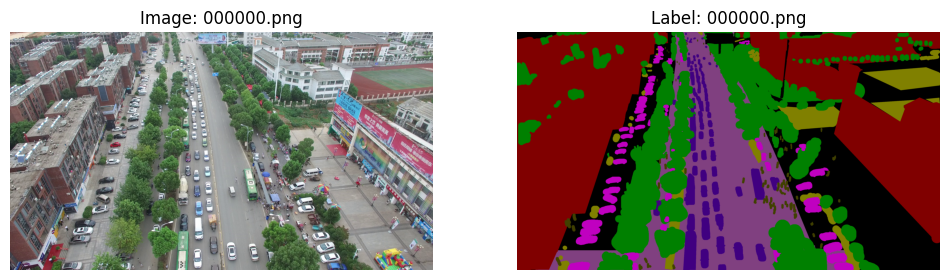

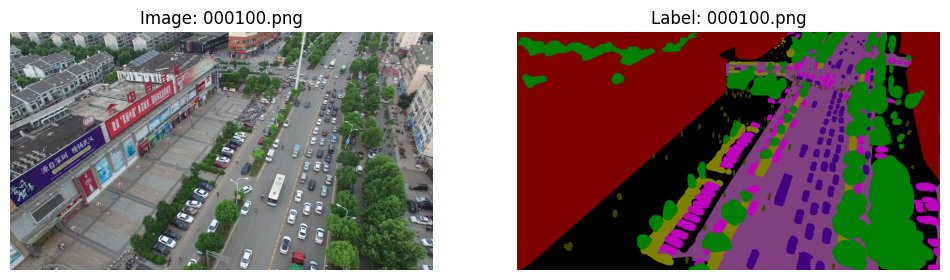

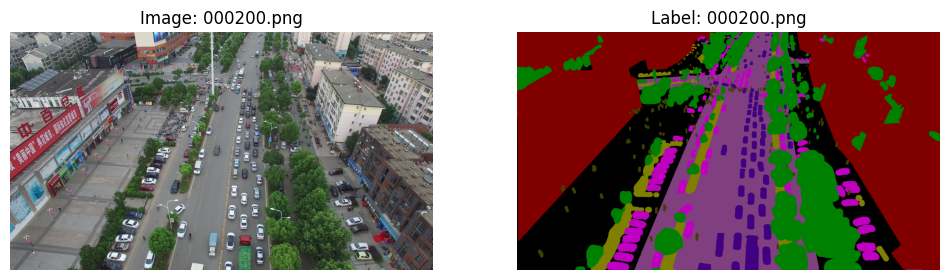

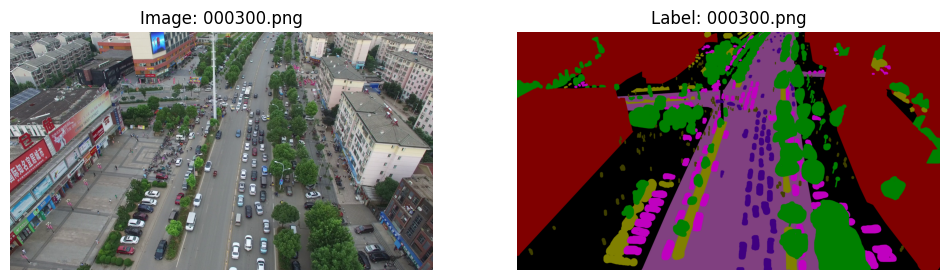

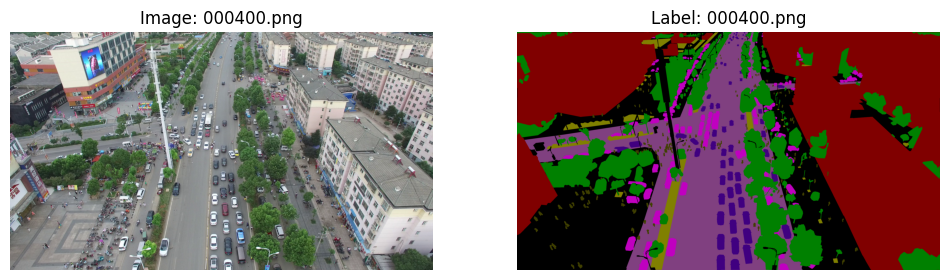

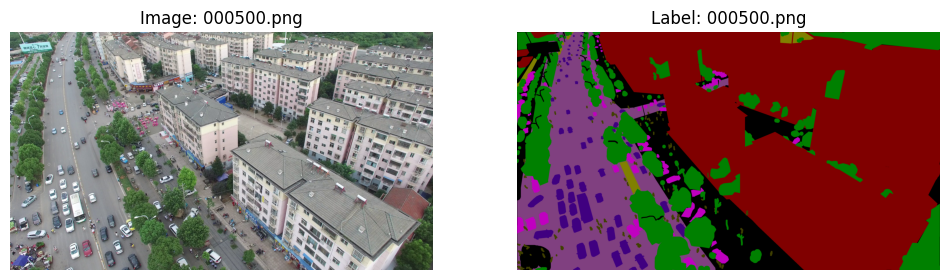

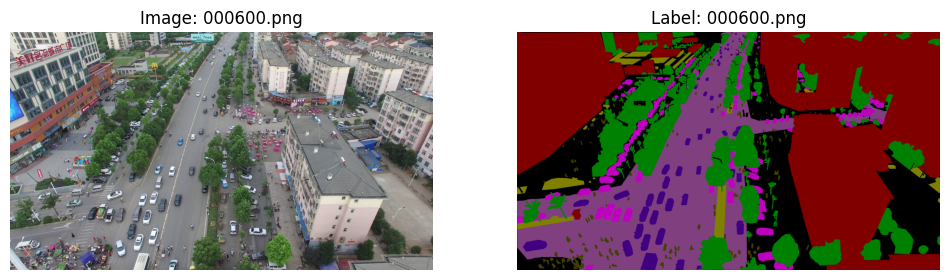

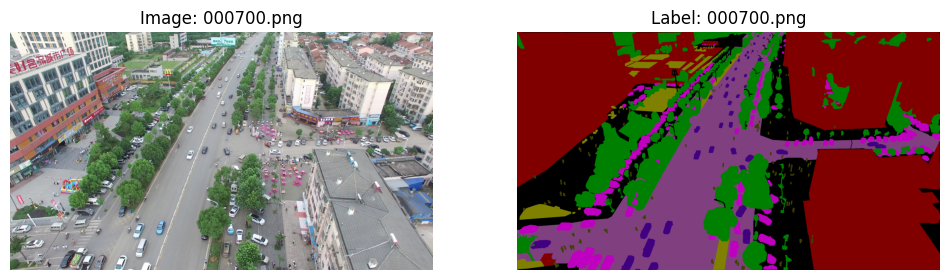

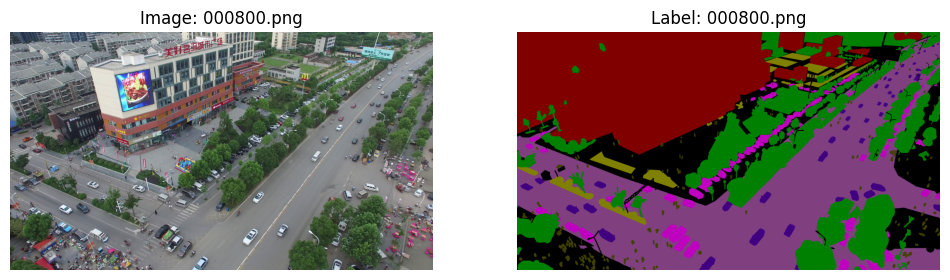

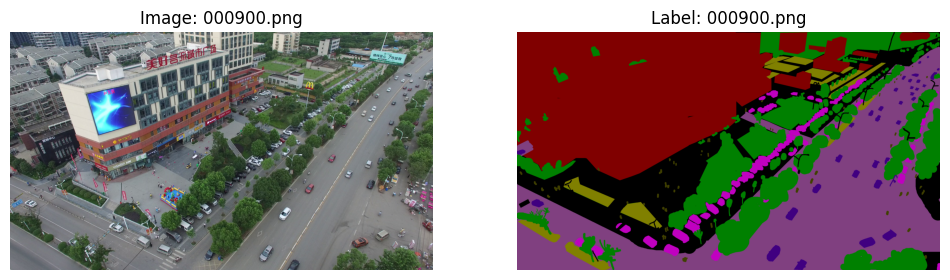

In [10]:
for i in train_indices[:1]:
    for j in range(10):
        display_image_and_label(train_dir, f'seq{i}', f'000{j}00.png')

Display validation images and labels:

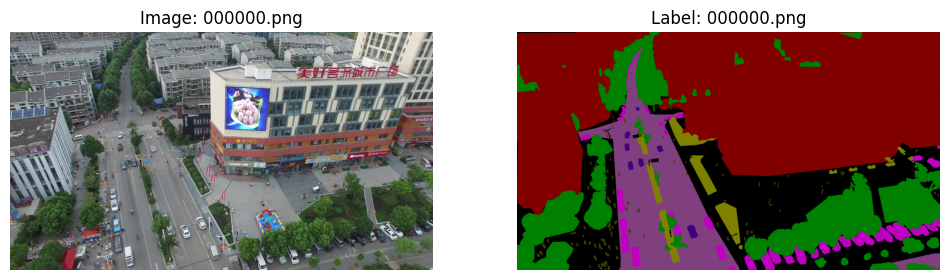

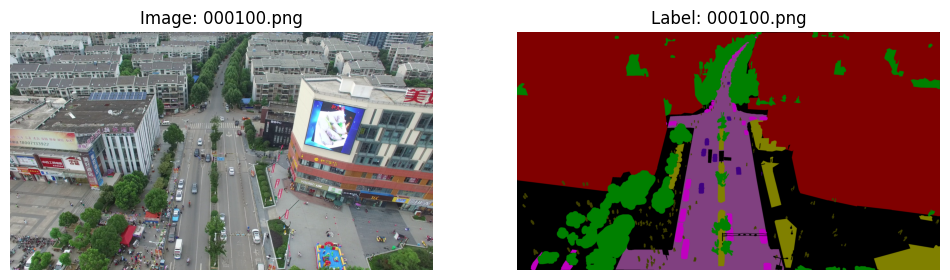

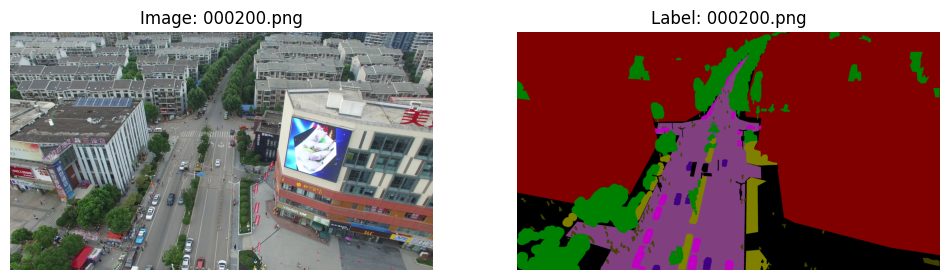

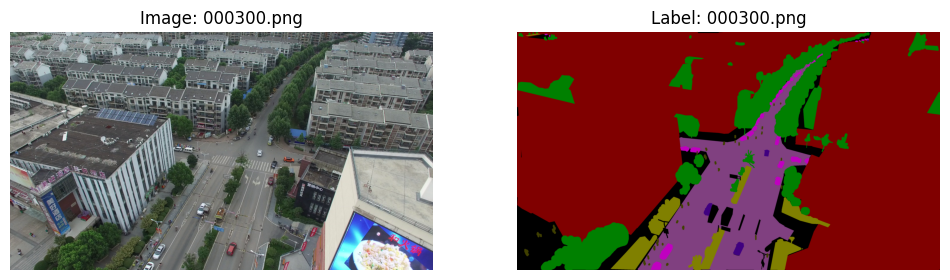

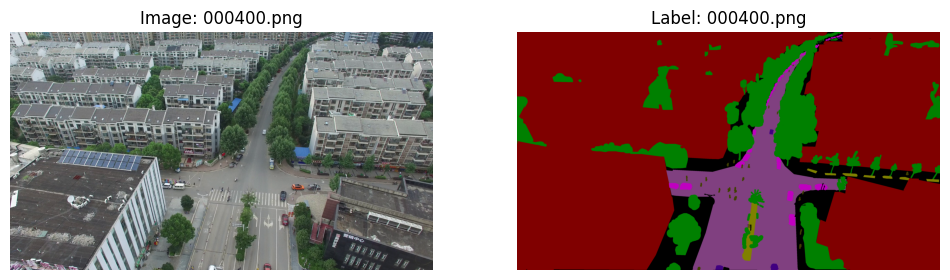

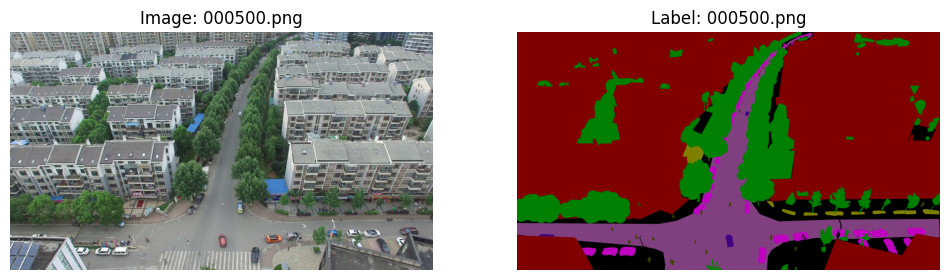

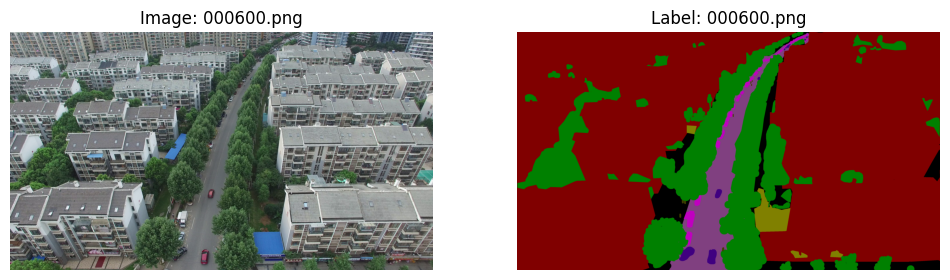

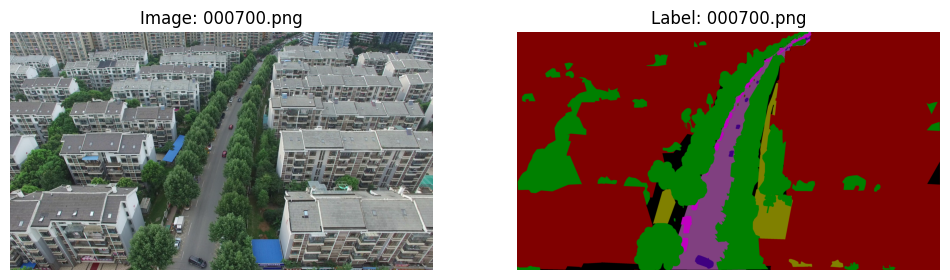

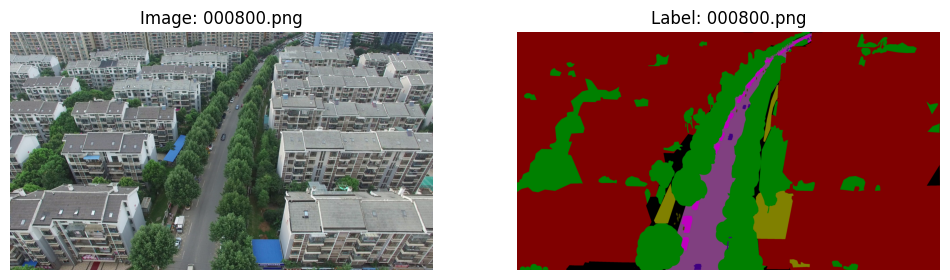

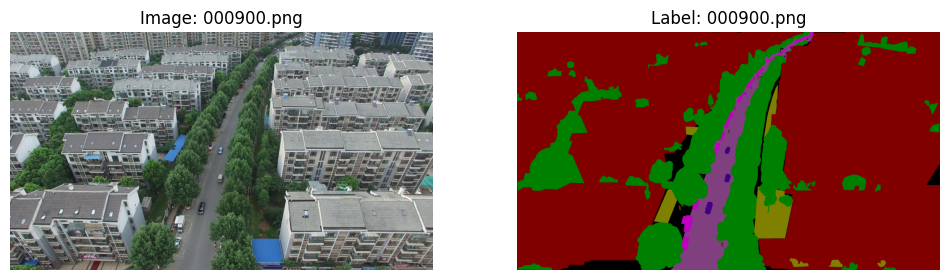

In [ ]:
for i in validation_indices[:1]:
    for j in range(10):
        display_image_and_label(validation_dir, f'seq{i}', f'000{j}00.png')

Display test images:

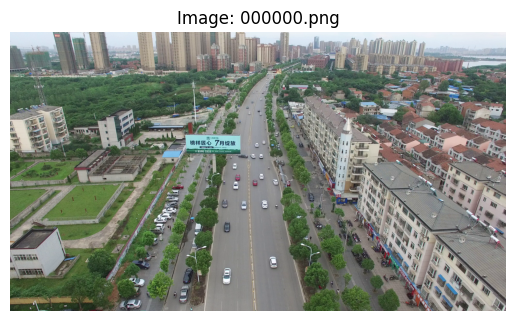

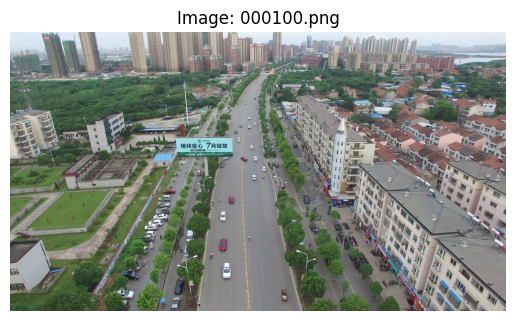

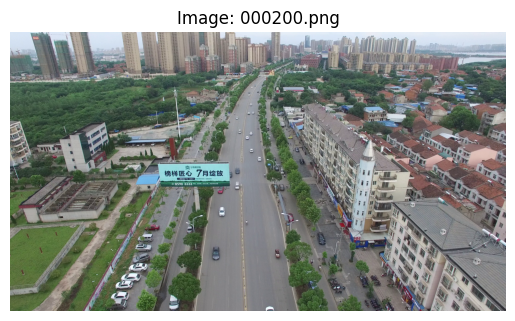

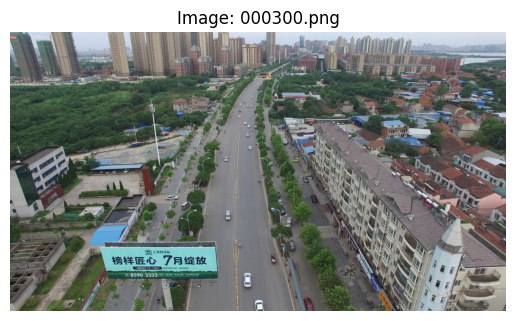

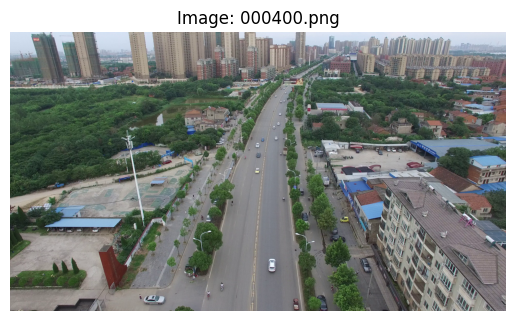

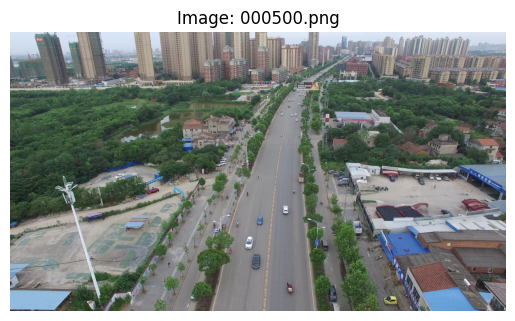

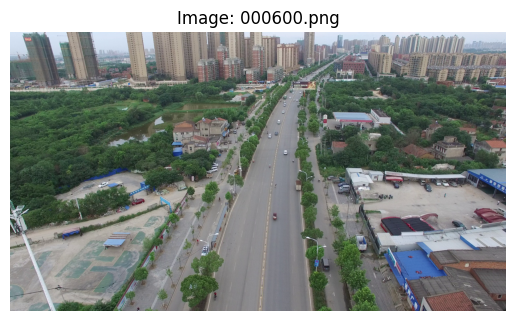

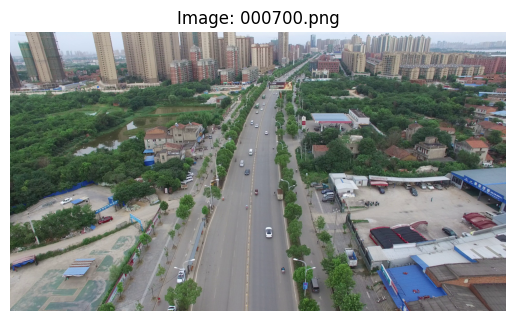

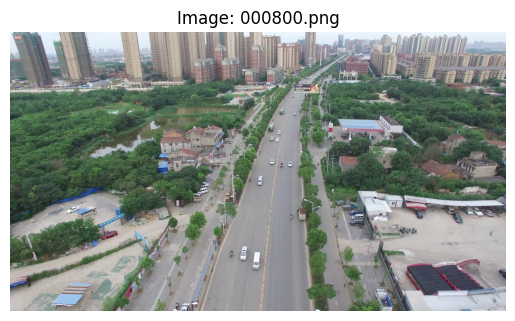

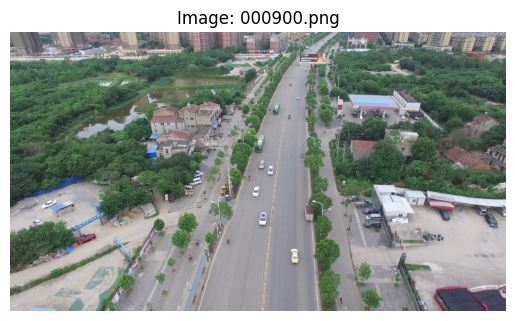

In [ ]:
for i in test_indices[:1]:
    for j in range(10):
        display_image_and_label(test_dir, f'seq{i}', f'000{j}00.png', test=True)

Get the size of an image:

In [9]:
for i in train_indices[:1]:
    for j in range(1):
        img_path = os.path.join(train_dir, f'seq{i}', 'Images', f'000{j}00.png')
        img = Image.open(img_path)
        print(img.size)

(3840, 2160)


Now we define a function that transforms the labeled images to class label map. Basically, each pixel's color (corresponding to a class) is transformed into a class index value.

In [32]:
def color_to_class(label_image):
    color_map = {
        (128, 0, 0): 0,       # Building
        (128, 64, 128): 1,    # Road
        (192, 0, 192): 2,     # Static car
        (0, 128, 0): 3,       # Tree
        (128, 128, 0): 4,     # Low vegetation
        (64, 64, 0): 5,       # Human
        (64, 0, 128): 6,      # Moving car
        (0, 0, 0): 7,         # Background clutter
    }

    label_array = np.array(label_image)

    label_class = np.zeros((label_array.shape[0], label_array.shape[1]), dtype=np.int64)

    color_keys = np.array(list(color_map.keys()))
    color_values = np.array(list(color_map.values()))

    reshaped_image = label_array.reshape(-1, 3)  # Flatten the spatial dimensions
    indices = np.argwhere(np.all(reshaped_image[:, None, :] == color_keys[None, :, :], axis=2))[:, 1]
    label_class = color_values[indices].reshape(label_array.shape[:2])

    return torch.tensor(label_class, dtype=torch.long).unsqueeze(0)  

Build the data loaders. We resize the images to (128, 128) in order to make the training faster.

Image batch size: torch.Size([8, 3, 128, 128])
Label batch size: torch.Size([8, 1, 128, 128])


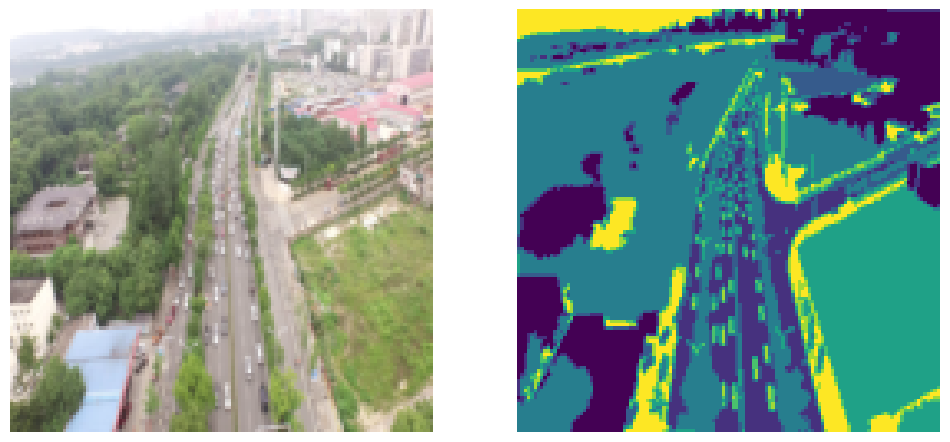

In [33]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

# Custom dataset class for UAVid
class UAVidDataset(Dataset):
    def __init__(self, root_dir, transform=None, label_transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.label_transform = label_transform
        self.image_paths = []
        self.label_paths = []

        for seq in os.listdir(root_dir):
            seq_img_dir = os.path.join(root_dir, seq, 'Images')
            seq_label_dir = os.path.join(root_dir, seq, 'Labels')

            for img_name in os.listdir(seq_img_dir):
                self.image_paths.append(os.path.join(seq_img_dir, img_name))
                self.label_paths.append(os.path.join(seq_label_dir, img_name))

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label_path = self.label_paths[idx]
        
        image = Image.open(img_path)
        label_image = Image.open(label_path)

        if self.transform:
            image = self.transform(image)

        label = color_to_class(label_image)  

        if self.label_transform:
            label = self.label_transform(label)

        return image, label


image_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
])

label_transform = transforms.Compose([
    transforms.Resize((128, 128)),
])

train_dataset = UAVidDataset(train_dir, transform=image_transform, label_transform=label_transform)
validation_dataset = UAVidDataset(validation_dir, transform=image_transform, label_transform=label_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, pin_memory=True)
validation_loader = DataLoader(validation_dataset, batch_size=8, shuffle=False, pin_memory=True)

# Displaying a batch of images and labels
for images, labels in train_loader:
    print(f"Image batch size: {images.size()}")
    print(f"Label batch size: {labels.size()}")

    image_to_display = images[0].permute(1, 2, 0).numpy()
    label_to_display = labels[0].permute(1, 2, 0).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image_to_display)
    axes[0].axis('off')  

    axes[1].imshow(label_to_display)
    axes[1].axis('off')  
    plt.show()
    break  

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        # Encoder
        self.enc1 = self.conv_block(in_channels, 32)
        self.enc2 = self.conv_block(32, 64)
        self.enc3 = self.conv_block(64, 128)
        self.enc4 = self.conv_block(128, 256)

        # Bottleneck
        self.bottleneck = self.conv_block(256, 512)

        # Decoder
        self.dec4 = self.upconv_block(512 + 256, 256)  # Bottleneck + enc4
        self.dec3 = self.upconv_block(256 + 128, 128)   # dec4 + enc3
        self.dec2 = self.upconv_block(128 + 64, 64)   # dec3 + enc2
        self.dec1 = self.upconv_block(64 + 32, 32)     # dec2 + enc1

        # Final convolution
        self.final_conv = nn.Conv2d(32, out_channels, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def upconv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, 2))
        enc3 = self.enc3(F.max_pool2d(enc2, 2))
        enc4 = self.enc4(F.max_pool2d(enc3, 2))

        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, 2))

        # Decoder
        dec4 = self.dec4(torch.cat([F.interpolate(bottleneck, enc4.size()[2:], mode='bilinear', align_corners=False), enc4], dim=1))
        dec3 = self.dec3(torch.cat([F.interpolate(dec4, enc3.size()[2:], mode='bilinear', align_corners=False), enc3], dim=1))
        dec2 = self.dec2(torch.cat([F.interpolate(dec3, enc2.size()[2:], mode='bilinear', align_corners=False), enc2], dim=1))
        dec1 = self.dec1(torch.cat([F.interpolate(dec2, enc1.size()[2:], mode='bilinear', align_corners=False), enc1], dim=1))

        # Output
        return self.final_conv(dec1)

model = UNet(in_channels=3, out_channels=8)
print(model)


UNet(
  (enc1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (enc4): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (bottleneck): Sequential(
    (0): Conv2d(256, 512, kernel

Now, we have to define the IoU loss, which is:

1. **Intersection**: 
   $$
   \text{Intersection} = \sum (\text{predictions} \cdot \text{labels\_one\_hot})
   $$

2. **Union**:
   $$
   \text{Union} = \sum (\text{predictions} + \text{labels\_one\_hot}) - \text{Intersection}
   $$

3. **IoU**:
   $$
   \text{IoU} = \frac{\text{Intersection} + \epsilon}{\text{Union} + \epsilon}
   $$

4. **IoU Loss**:
   $$
   \text{IoU Loss} = 1 - \text{IoU}
   $$

In [34]:
def iou_loss(predictions, labels, eps=1e-6):
    num_classes = predictions.shape[1]

    labels_one_hot = F.one_hot(labels, num_classes=num_classes).permute(0, 3, 1, 2).float()  

    intersection = (predictions * labels_one_hot).sum(dim=(2, 3))  
    union = (predictions + labels_one_hot).sum(dim=(2, 3)) - intersection  

    iou = (intersection + eps) / (union + eps)

    return 1 - iou.mean()

Train the model for 100 epochs, with an initial learning rate of 0.001 and Adam optimizer:

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=3, out_channels=8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
epochs = 100

scaler = torch.amp.GradScaler()

for epoch in range(epochs):
    model.train()
    running_iou_loss = 0.0  # For training loss

    # Training loop
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze(1).long()

        optimizer.zero_grad()

        with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
            outputs = model(images)
            predictions = torch.softmax(outputs, dim=1)

            iou_loss_value = iou_loss(predictions, labels)

        scaler.scale(iou_loss_value).backward()
        scaler.step(optimizer)
        scaler.update()

        running_iou_loss += iou_loss_value.item()

    avg_iou_loss = running_iou_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Training IoU Loss: {avg_iou_loss:.4f}")
    
    # Validation loop
    model.eval()  # Set the model to evaluation mode
    running_val_iou_loss = 0.0  # For validation loss

    with torch.no_grad():  # Disable gradients during validation
        for images, labels in validation_loader:  # Assuming you have a validation DataLoader
            images, labels = images.to(device), labels.to(device)
            labels = labels.squeeze(1).long()

            with torch.amp.autocast(device_type='cuda', dtype=torch.float16):
                outputs = model(images)
                predictions = torch.softmax(outputs, dim=1)

                val_iou_loss_value = iou_loss(predictions, labels)

            running_val_iou_loss += val_iou_loss_value.item()

    avg_val_iou_loss = running_val_iou_loss / len(validation_loader)
    print(f"Epoch [{epoch+1}/{epochs}], Validation IoU Loss: {avg_val_iou_loss:.4f}")

Epoch [1/100], Training IoU Loss: 0.9411
Epoch [1/100], Validation IoU Loss: 0.9373
Epoch [2/100], Training IoU Loss: 0.9254
Epoch [2/100], Validation IoU Loss: 0.9167
Epoch [3/100], Training IoU Loss: 0.9002
Epoch [3/100], Validation IoU Loss: 0.8924
Epoch [4/100], Training IoU Loss: 0.8828
Epoch [4/100], Validation IoU Loss: 0.8711
Epoch [5/100], Training IoU Loss: 0.8609
Epoch [5/100], Validation IoU Loss: 0.8510
Epoch [6/100], Training IoU Loss: 0.8447
Epoch [6/100], Validation IoU Loss: 0.8359
Epoch [7/100], Training IoU Loss: 0.8315
Epoch [7/100], Validation IoU Loss: 0.8179
Epoch [8/100], Training IoU Loss: 0.8166
Epoch [8/100], Validation IoU Loss: 0.8120
Epoch [9/100], Training IoU Loss: 0.8088
Epoch [9/100], Validation IoU Loss: 0.8039
Epoch [10/100], Training IoU Loss: 0.8092
Epoch [10/100], Validation IoU Loss: 0.8049
Epoch [11/100], Training IoU Loss: 0.7976
Epoch [11/100], Validation IoU Loss: 0.7880
Epoch [12/100], Training IoU Loss: 0.7886
Epoch [12/100], Validation IoU

Function for converting the model predictions to actual images of the segmented data:

In [22]:
def class_to_color(prediction):
    color_map = {
        0: (128, 0, 0),       # Building
        1: (128, 64, 128),    # Road
        2: (192, 0, 192),     # Static car
        3: (0, 128, 0),       # Tree
        4: (128, 128, 0),     # Low vegetation
        5: (64, 64, 0),       # Human
        6: (64, 0, 128),      # Moving car
        7: (0, 0, 0),         # Background clutter
    }

    height, width = prediction.shape
    color_image = np.zeros((height, width, 3), dtype=np.uint8)

    for class_index, color in color_map.items():
        color_image[prediction == class_index] = color

    return color_image

Compare the model predictions to the ground truth for the first 5 samples of the validation data:

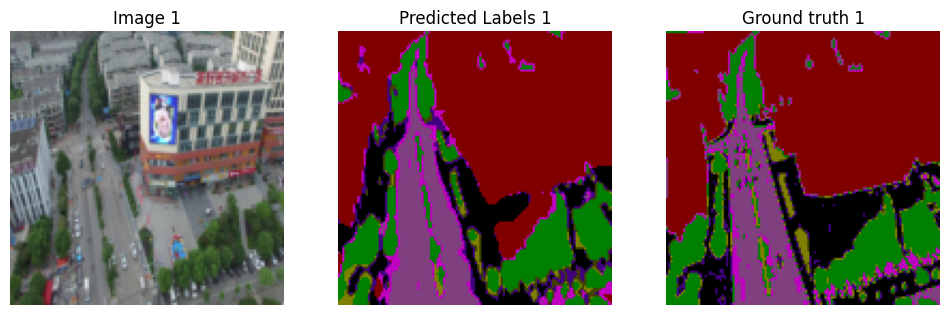

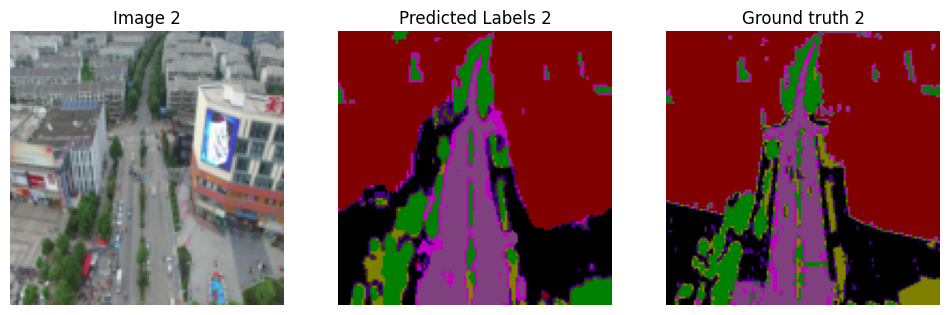

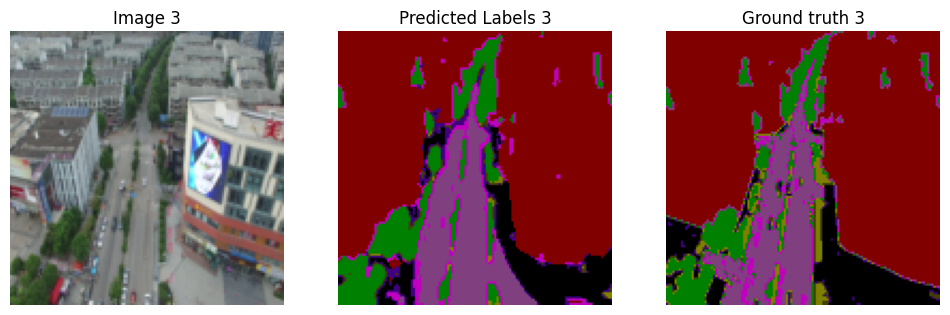

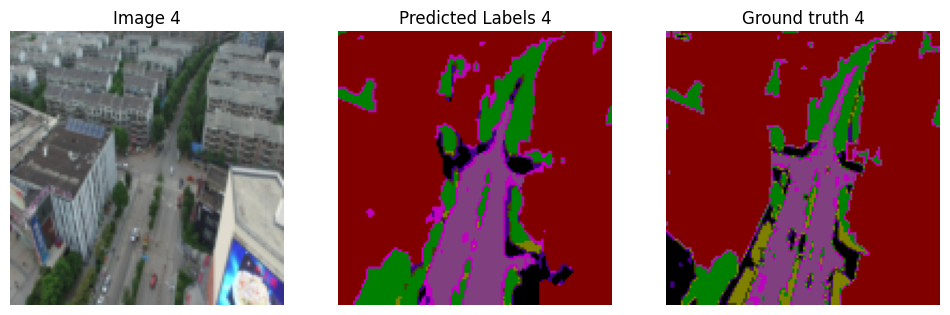

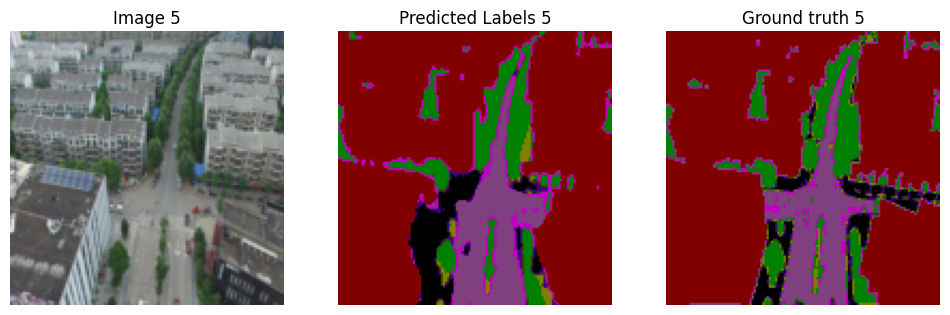

In [29]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

for images, labels in validation_loader:
    images, labels = images.to(device), labels.to(device)

    out = model(images)

    predicted_labels = torch.argmax(out, dim=1)  

    for i in range(min(5, images.size(0))): 
        image_to_display = images[i].permute(1, 2, 0).cpu().numpy()  
        ground_truth = labels[i].squeeze().cpu().numpy()
        predicted_label = predicted_labels[i].detach().cpu().numpy()  

        label_to_display = class_to_color(predicted_label)
        ground_truth_to_display = class_to_color(ground_truth)

        fig, axes = plt.subplots(1, 3, figsize=(12, 6))
        axes[0].imshow(image_to_display)
        axes[0].set_title(f"Image {i + 1}")
        axes[0].axis('off')  

        axes[1].imshow(label_to_display)
        axes[1].set_title(f"Predicted Labels {i + 1}")
        axes[1].axis('off')  

        axes[2].imshow(ground_truth_to_display)
        axes[2].set_title(f"Ground truth {i + 1}")
        axes[2].axis('off')  

        plt.show()
    break  

Calculate the IoU loss over the validation set:

In [36]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

model.eval()  
validation_iou_loss = 0.0  
num_batches = 0  

with torch.no_grad(): 
    for images, labels in validation_loader:
        images, labels = images.to(device), labels.to(device)
        labels = labels.squeeze().long()

        out = model(images)
        predictions = torch.softmax(out, dim=1)  

        batch_iou_loss = iou_loss(predictions, labels)
        validation_iou_loss += batch_iou_loss.item()  
        num_batches += 1  

average_validation_iou_loss = validation_iou_loss / num_batches
print(f"Average IoU Loss on Validation Set: {average_validation_iou_loss:.4f}")

Average IoU Loss on Validation Set: 0.6419
